In [1]:
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from analysis_dependencies import get_uvmet
from analysis_dependencies import get_wrf_slp
from analysis_dependencies import get_wrf_rh
from analysis_dependencies import get_wrf_tk
from analysis_dependencies import get_wrf_th
from analysis_dependencies import get_wrf_ss
from analysis_dependencies import gen_wrf_proj
from analysis_dependencies import gen_cartopy_proj
from analysis_dependencies import get_wrf_kinematic
from analysis_dependencies import compute_inverse_laplacian
from analysis_dependencies import plan_section_plot
from analysis_dependencies import cross_section_plot
import datetime
import wrf
import cartopy
from cartopy import crs as ccrs
from cartopy import feature as cfeature
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import xarray as xr

In [2]:
unpDir = '/home/bhoover/UWAOS/WRF_QOIP/data_repository/final_runs/march2020/R_mu/unperturbed/'
negDir = '/home/bhoover/UWAOS/WRF_QOIP/data_repository/final_runs/march2020/R_mu/negative/uvTq/ptdi14/'
posDir = '/home/bhoover/UWAOS/WRF_QOIP/data_repository/final_runs/march2020/R_mu/positive/uvTq/ptdi22/'
dtInit = datetime.datetime(2020, 3, 6, 12)

In [3]:
fcstHr = 24
dtFcst = dtInit + datetime.timedelta(hours=fcstHr)
dtInitStr = datetime.datetime.strftime(dtInit,'%Y-%m-%d_%H:00:00')
dtFcstStr = datetime.datetime.strftime(dtFcst,'%Y-%m-%d_%H:00:00')
unpWRFInputFile = unpDir + 'wrfinput_d01'
negWRFInputFile = negDir + 'wrfinput_d01'
posWRFInputFile = posDir + 'wrfinput_d01'
unpFileInit = unpDir + 'wrfout_d01_' + dtInitStr
negFileInit = negDir + 'wrfout_d01_' + dtInitStr
posFileInit = posDir + 'wrfout_d01_' + dtInitStr
unpFileFcst = unpDir + 'wrfout_d01_' + dtFcstStr
negFileFcst = negDir + 'wrfout_d01_' + dtFcstStr
posFileFcst = posDir + 'wrfout_d01_' + dtFcstStr
unpHdlInit = Dataset(unpFileInit)
negHdlInit = Dataset(negFileInit)
posHdlInit = Dataset(posFileInit)
unpHdlFcst = Dataset(unpFileFcst)
negHdlFcst = Dataset(negFileFcst)
posHdlFcst = Dataset(posFileFcst)

In [4]:
# draw lat, lon, and projection data from unpHdlInit, draw pressure from all files for interpolation
# all other fields are computed on an as-needed basis
lat = np.asarray(unpHdlInit.variables['XLAT']).squeeze()
lon = np.asarray(unpHdlInit.variables['XLONG']).squeeze()
fix = np.where(lon < 0.)
lon[fix] = lon[fix] + 360.

datProj = gen_cartopy_proj(unpHdlInit)
plotProj = ccrs.PlateCarree()

unpPInit = np.asarray(wrf.getvar(unpHdlInit,'p')).squeeze()
negPInit = np.asarray(wrf.getvar(negHdlInit,'p')).squeeze()
posPInit = np.asarray(wrf.getvar(posHdlInit,'p')).squeeze()
unpPFcst = np.asarray(wrf.getvar(unpHdlFcst,'p')).squeeze()
negPFcst = np.asarray(wrf.getvar(negHdlFcst,'p')).squeeze()
posPFcst = np.asarray(wrf.getvar(posHdlFcst,'p')).squeeze()

generating 2 contours


<a list of 15 text.Text objects>

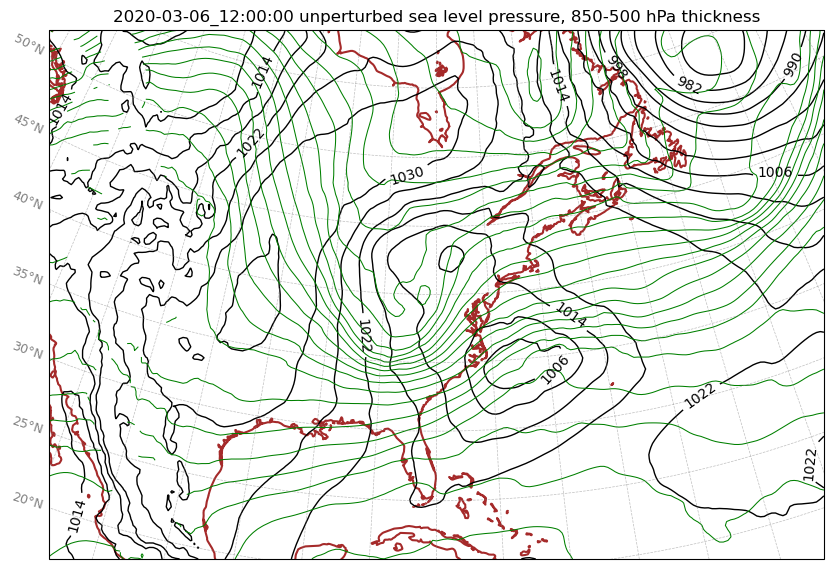

In [5]:
# plan-section figure: unperturbed sea-level pressure and 850-500 hPa thicknesses
hgt = np.asarray(wrf.getvar(unpHdlInit, 'z')).squeeze()
prs = unpPInit
hgt850 = wrf.interplevel(field3d=hgt,
                         vert=prs,
                         desiredlev=85000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
hgt500 = wrf.interplevel(field3d=hgt,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
unpThkInit_850_500 = hgt500 - hgt850
unpSlpInit = np.asarray(get_wrf_slp(unpHdlInit)).squeeze()

slprng = np.arange(950.,1050.1,4.)
thkrng = np.arange(3700.,4500.1,25.)

fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(10,7), subplot_kw={'projection' : datProj})

ax, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpSlpInit, unpThkInit_850_500],
                                        contIntervalList=[slprng, thkrng], 
                                        contColorList=['black', 'green'],
                                        contLineThicknessList=[1.0, 0.75],
                                        shadVariable=None,
                                        shadInterval=None,
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap=None,
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None,
                                        figax=ax)
# add a title
ax.set_title(dtInitStr + ' unperturbed sea level pressure, 850-500 hPa thickness')
# add contour labels to slp
ax.clabel(cons[0],levels=slprng[::2])


generating 2 contours
generating 2 contours
generating 2 contours
generating 2 contours


<a list of 15 text.Text objects>

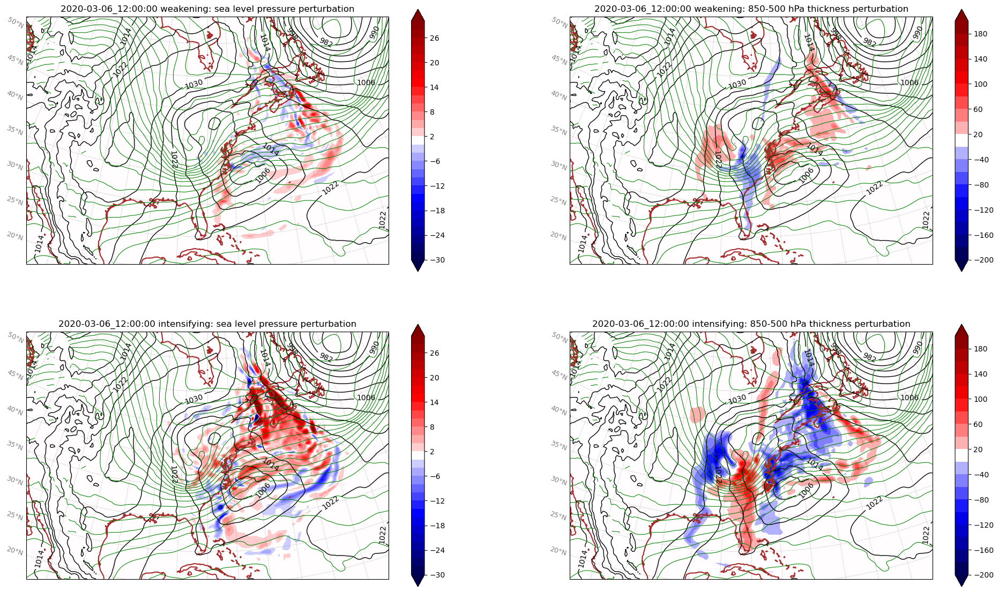

In [6]:
# plan-section figure: perturbation sea-level pressure (left) and 850-500 thickness (right)
#                      for weakening case (top) and intensifying case (bottom)
hgt = np.asarray(wrf.getvar(posHdlInit, 'z')).squeeze()
prs = posPInit
hgt850 = wrf.interplevel(field3d=hgt,
                         vert=prs,
                         desiredlev=85000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
hgt500 = wrf.interplevel(field3d=hgt,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
posThkInit_850_500 = hgt500 - hgt850
posSlpInit = np.asarray(get_wrf_slp(posHdlInit)).squeeze()

hgt = np.asarray(wrf.getvar(negHdlInit, 'z')).squeeze()
prs = negPInit
hgt850 = wrf.interplevel(field3d=hgt,
                         vert=prs,
                         desiredlev=85000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
hgt500 = wrf.interplevel(field3d=hgt,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
negThkInit_850_500 = hgt500 - hgt850
negSlpInit = np.asarray(get_wrf_slp(negHdlInit)).squeeze()

shdrng = np.arange(-30.,30.1,2.)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
slprng = np.arange(950.,1050.1,4.)
thkrng = np.arange(3700.,4500.1,25.)

fig, axs = plt.subplots(ncols=2,nrows=2,figsize=(24,14), subplot_kw={'projection' : datProj})

#
# Top: weakening experiment slp perturbation (left) and 850-500 hPa thickness perturbation (right)
#

ax, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpSlpInit, unpThkInit_850_500],
                                        contIntervalList=[slprng, thkrng], 
                                        contColorList=['black', 'green'],
                                        contLineThicknessList=[1.0, 0.75],
                                        shadVariable=negSlpInit - unpSlpInit,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None,
                                        figax=axs[0][0])
# add a title
axs[0][0].set_title(dtInitStr + ' weakening: sea level pressure perturbation')
# add contour labels to slp
axs[0][0].clabel(cons[0],levels=slprng[::2])

shdrng = np.arange(-200.,200.1,20.)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
slprng = np.arange(950.,1050.1,4.)
thkrng = np.arange(3700.,4500.1,25.)

ax, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpSlpInit, unpThkInit_850_500],
                                        contIntervalList=[slprng, thkrng], 
                                        contColorList=['black', 'green'],
                                        contLineThicknessList=[1.0, 0.75],
                                        shadVariable=negThkInit_850_500 - unpThkInit_850_500,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None,
                                        figax=axs[0][1])
# add a title
axs[0][1].set_title(dtInitStr + ' weakening: 850-500 hPa thickness perturbation')
# add contour labels to slp
axs[0][1].clabel(cons[0],levels=slprng[::2])

#
# Bottom: intensifying experiment slp perturbation (left) and 850-500 thicknesses (right)
#

shdrng = np.arange(-30.,30.1,2.)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
slprng = np.arange(950.,1050.1,4.)
thkrng = np.arange(3700.,4500.1,25.)

ax, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpSlpInit, unpThkInit_850_500],
                                        contIntervalList=[slprng, thkrng], 
                                        contColorList=['black', 'green'],
                                        contLineThicknessList=[1.0, 0.75],
                                        shadVariable=posSlpInit - unpSlpInit,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None,
                                        figax=axs[1][0])
# add a title
axs[1][0].set_title(dtInitStr + ' intensifying: sea level pressure perturbation')
# add contour labels to slp
axs[1][0].clabel(cons[0],levels=slprng[::2])

shdrng = np.arange(-200.,200.1,20.)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
slprng = np.arange(950.,1050.1,4.)
thkrng = np.arange(3700.,4500.1,25.)

ax, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpSlpInit, unpThkInit_850_500],
                                        contIntervalList=[slprng, thkrng], 
                                        contColorList=['black', 'green'],
                                        contLineThicknessList=[1.0, 0.75],
                                        shadVariable=posThkInit_850_500 - unpThkInit_850_500,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None,
                                        figax=axs[1][1])
# add a title
axs[1][1].set_title(dtInitStr + ' intensifying: 850-500 hPa thickness perturbation')
# add contour labels to slp
axs[1][1].clabel(cons[0],levels=slprng[::2])

generating 1 contours


<a list of 12 text.Text objects>

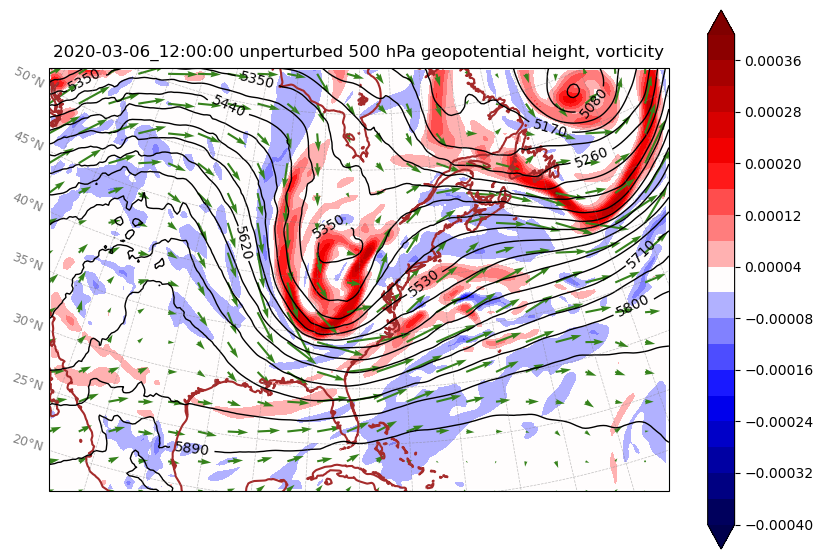

In [7]:
# plan-section figure: unperturbed 500 hPa geopotential height, wind vectors, and vorticity
hgt = np.asarray(wrf.getvar(unpHdlInit, 'z')).squeeze()
prs = unpPInit
unpHgt500Init = wrf.interplevel(field3d=hgt,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
u, v = get_uvmet(unpHdlInit)
vor = get_wrf_kinematic(unpHdlInit, 'vor')
unpVor500Init = wrf.interplevel(field3d=vor,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
unpUwd500Init = wrf.interplevel(field3d=u,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
unpVwd500Init = wrf.interplevel(field3d=v,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
hgtrng = np.arange(4900.,6550.1,45.)
vorrng = 1.0E-05 * np.arange(-40.,40.01,4.)
mask = np.ones((np.shape(vorrng)),dtype='bool')
mask[np.where(vorrng==0.)] = False

fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(10,7), subplot_kw={'projection' : datProj})

ax, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpHgt500Init],
                                        contIntervalList=[hgtrng], 
                                        contColorList=['black'],
                                        contLineThicknessList=[1.0],
                                        shadVariable=unpVor500Init,
                                        shadInterval=vorrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=unpUwd500Init,
                                        vVecVariable=unpVwd500Init,
                                        vectorThinning=10,
                                        vecColor='#35821b',
                                        figax=ax)
# add a title
ax.set_title(dtInitStr + ' unperturbed 500 hPa geopotential height, vorticity')
# add contour labels to hgt
ax.clabel(cons[0],levels=hgtrng[::2])

generating 1 contours
generating 1 contours
generating 1 contours
generating 1 contours


<a list of 12 text.Text objects>

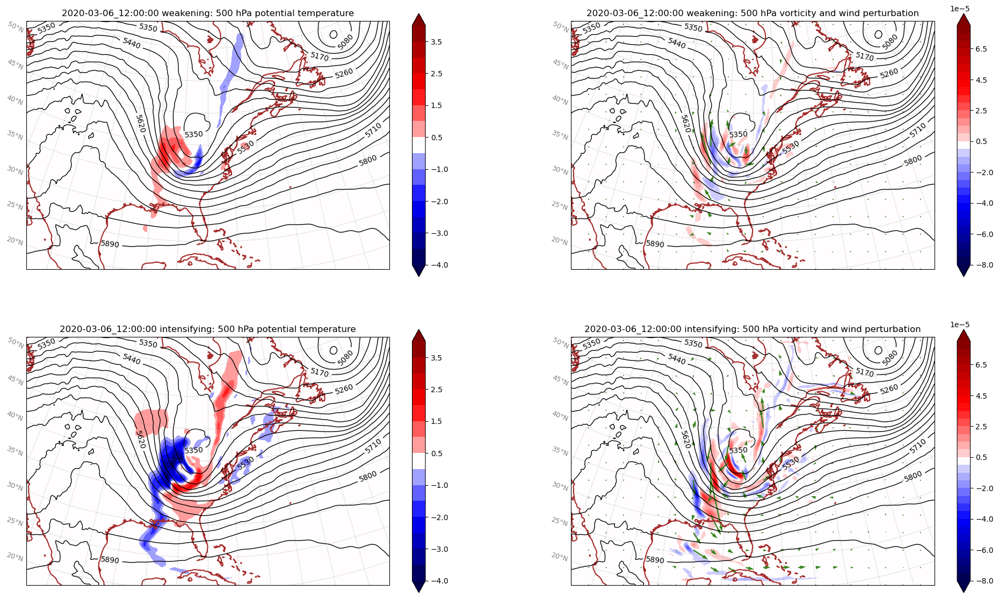

In [15]:
pot = get_wrf_th(unpHdlInit)
prs = unpPInit
unpPot500Init = wrf.interplevel(field3d=pot,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
u, v = get_uvmet(posHdlInit)
vor = get_wrf_kinematic(posHdlInit, 'vor')
posVor500Init = wrf.interplevel(field3d=vor,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
posUwd500Init = wrf.interplevel(field3d=u,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
posVwd500Init = wrf.interplevel(field3d=v,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
pot = get_wrf_th(posHdlInit)
prs = posPInit
posPot500Init = wrf.interplevel(field3d=pot,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
u, v = get_uvmet(negHdlInit)
vor = get_wrf_kinematic(negHdlInit, 'vor')
negVor500Init = wrf.interplevel(field3d=vor,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
negUwd500Init = wrf.interplevel(field3d=u,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
negVwd500Init = wrf.interplevel(field3d=v,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
pot = get_wrf_th(negHdlInit)
prs = negPInit
negPot500Init = wrf.interplevel(field3d=pot,
                         vert=prs,
                         desiredlev=50000.,
                         missing=np.nan,
                         squeeze=True,
                         meta=False)
# plan-section figure: perturbation 500 hPa potential temperature and winds (left) and 500 hPa
#                      perturbation vorticity (right) for weakening case (top) and
#                      intensifying case (bottom)

shdrng = np.arange(-4.,4.01,0.5)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
hgtrng = np.arange(4900.,6550.1,45.)


fig, axs = plt.subplots(ncols=2,nrows=2,figsize=(24,14), subplot_kw={'projection' : datProj})

#
# Top: weakening experiment potential temperature perturbation (left) and 500 hPa vorticity and wind perturbation (right)
#

ax, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpHgt500Init],
                                        contIntervalList=[hgtrng], 
                                        contColorList=['black'],
                                        contLineThicknessList=[1.0],
                                        shadVariable=negPot500Init - unpPot500Init,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None,
                                        figax=axs[0][0])
# add a title
axs[0][0].set_title(dtInitStr + ' weakening: 500 hPa potential temperature')
# add contour labels to hgt
axs[0][0].clabel(cons[0],levels=hgtrng[::2])

shdrng = 1.0E-05 * np.arange(-8.,8.01,0.5)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
hgtrng = np.arange(4900.,6550.1,45.)

ax, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpHgt500Init],
                                        contIntervalList=[hgtrng], 
                                        contColorList=['black'],
                                        contLineThicknessList=[1.0],
                                        shadVariable=negVor500Init - unpVor500Init,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=negUwd500Init - unpUwd500Init,
                                        vVecVariable=negVwd500Init - unpVwd500Init,
                                        vectorThinning=10,
                                        vecColor='#35821b',
                                        vectorScale=30,
                                        figax=axs[0][1])
# add a title
axs[0][1].set_title(dtInitStr + ' weakening: 500 hPa vorticity and wind perturbation')
# add contour labels to hgt
axs[0][1].clabel(cons[0],levels=hgtrng[::2])

#
# Bottom: intensifying experiment potential temperature perturbation (left) and 500 hPa vorticity and wind perturbation (right)
#

shdrng = np.arange(-4.,4.01,0.5)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
hgtrng = np.arange(4900.,6550.1,45.)

ax, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpHgt500Init],
                                        contIntervalList=[hgtrng], 
                                        contColorList=['black'],
                                        contLineThicknessList=[1.0],
                                        shadVariable=posPot500Init - unpPot500Init,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None,
                                        figax=axs[1][0])
# add a title
axs[1][0].set_title(dtInitStr + ' intensifying: 500 hPa potential temperature')
# add contour labels to hgt
axs[1][0].clabel(cons[0],levels=hgtrng[::2])

shdrng = 1.0E-05 * np.arange(-8.,8.01,0.5)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
hgtrng = np.arange(4900.,6550.1,45.)

ax, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpHgt500Init],
                                        contIntervalList=[hgtrng], 
                                        contColorList=['black'],
                                        contLineThicknessList=[1.0],
                                        shadVariable=posVor500Init - unpVor500Init,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=posUwd500Init - unpUwd500Init,
                                        vVecVariable=posVwd500Init - unpVwd500Init,
                                        vectorThinning=10,
                                        vecColor='#35821b',
                                        vectorScale=30,
                                        figax=axs[1][1])
# add a title
axs[1][1].set_title(dtInitStr + ' intensifying: 500 hPa vorticity and wind perturbation')
# add contour labels to hgt
axs[1][1].clabel(cons[0],levels=hgtrng[::2])


In [4]:
# draw lat, lon, and projection data from unpHdlInit, all other fields are computed on an as-needed basis
lat = np.asarray(unpHdlInit.variables['XLAT']).squeeze()
lon = np.asarray(unpHdlInit.variables['XLONG']).squeeze()
fix = np.where(lon < 0.)
lon[fix] = lon[fix] + 360.

datProj = gen_cartopy_proj(unpHdlInit)
plotProj = ccrs.PlateCarree()

unpSLPInit = np.asarray(get_wrf_slp(unpHdlInit)).squeeze()
ptdSLPInit = np.asarray(get_wrf_slp(ptdHdlInit)).squeeze()
unpSLPFcst = np.asarray(get_wrf_slp(unpHdlFcst)).squeeze()
ptdSLPFcst = np.asarray(get_wrf_slp(ptdHdlFcst)).squeeze()

unpRHInit = np.asarray(get_wrf_rh(unpHdlInit)).squeeze()
ptdRHInit = np.asarray(get_wrf_rh(ptdHdlInit)).squeeze()

unpHGTInit = np.asarray(wrf.getvar(unpHdlInit,'z')).squeeze()
ptdHGTInit = np.asarray(wrf.getvar(ptdHdlInit,'z')).squeeze()
unpHGTFcst = np.asarray(wrf.getvar(unpHdlFcst,'z')).squeeze()
ptdHGTFcst = np.asarray(wrf.getvar(ptdHdlFcst,'z')).squeeze()

unpTHTAInit = np.asarray(wrf.getvar(unpHdlInit,'theta')).squeeze()
ptdTHTAInit = np.asarray(wrf.getvar(ptdHdlInit,'theta')).squeeze()
unpTHTAFcst = np.asarray(wrf.getvar(unpHdlFcst,'theta')).squeeze()
ptdTHTAFcst = np.asarray(wrf.getvar(ptdHdlFcst,'theta')).squeeze()

unpPInit = np.asarray(wrf.getvar(unpHdlInit,'p')).squeeze()
ptdPInit = np.asarray(wrf.getvar(ptdHdlInit,'p')).squeeze()
unpPFcst = np.asarray(wrf.getvar(unpHdlFcst,'p')).squeeze()
ptdPFcst = np.asarray(wrf.getvar(ptdHdlFcst,'p')).squeeze()

unpUWDInit, unpVWDInit = np.asarray(get_uvmet(unpHdlInit))
unpUWDFcst, unpVWDFcst = np.asarray(get_uvmet(unpHdlFcst))
ptdUWDInit, ptdVWDInit = np.asarray(get_uvmet(ptdHdlInit))
ptdUWDFcst, ptdVWDFcst = np.asarray(get_uvmet(ptdHdlFcst))

plevs=np.arange(1000.,102000.,50.)

In [5]:
unpVORInit = get_wrf_kinematic(unpHdlInit,'vor')
unpDIVInit = get_wrf_kinematic(unpHdlInit,'div')
unpSTRInit = get_wrf_kinematic(unpHdlInit,'str')
unpSHRInit = get_wrf_kinematic(unpHdlInit,'shr')
unpDEFInit = (unpSTRInit**2. + unpSHRInit**2.)**0.5

ptdVORInit = get_wrf_kinematic(ptdHdlInit,'vor')
ptdDIVInit = get_wrf_kinematic(ptdHdlInit,'div')
ptdSTRInit = get_wrf_kinematic(ptdHdlInit,'str')
ptdSHRInit = get_wrf_kinematic(ptdHdlInit,'shr')
ptdDEFInit = (ptdSTRInit**2. + ptdSHRInit**2.)**0.5

In [6]:
# compute 850 and 500 potential temperature and winds
pk = 85000.  # Pa
unpVar1 = wrf.interplevel(field3d=unpHGTInit,
                          vert=unpPInit,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
ptdVar1 = wrf.interplevel(field3d=ptdHGTInit,
                          vert=ptdPInit,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
unpUWD850Init = wrf.interplevel(field3d=unpUWDInit,
                                vert=unpPInit,
                                desiredlev=pk,
                                missing=np.nan,
                                squeeze=True,
                                meta=False)
unpUWD850Fcst = wrf.interplevel(field3d=unpUWDFcst,
                                vert=unpPFcst,
                                desiredlev=pk,
                                missing=np.nan,
                                squeeze=True,
                                meta=False)
ptdUWD850Init = wrf.interplevel(field3d=ptdUWDInit,
                                vert=ptdPInit,
                                desiredlev=pk,
                                missing=np.nan,
                                squeeze=True,
                                meta=False)
ptdUWD850Fcst = wrf.interplevel(field3d=ptdUWDFcst,
                                vert=ptdPFcst,
                                desiredlev=pk,
                                missing=np.nan,
                                squeeze=True,
                                meta=False)
pk = 50000.  # Pa
unpVar2 = wrf.interplevel(field3d=unpHGTInit,
                          vert=unpPInit,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
ptdVar2 = wrf.interplevel(field3d=ptdHGTInit,
                          vert=ptdPInit,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
unpUWD500Init = wrf.interplevel(field3d=unpUWDInit,
                                vert=unpPInit,
                                desiredlev=pk,
                                missing=np.nan,
                                squeeze=True,
                                meta=False)
unpUWD500Fcst = wrf.interplevel(field3d=unpUWDFcst,
                                vert=unpPFcst,
                                desiredlev=pk,
                                missing=np.nan,
                                squeeze=True,
                                meta=False)
ptdUWD500Init = wrf.interplevel(field3d=ptdUWDInit,
                                vert=ptdPInit,
                                desiredlev=pk,
                                missing=np.nan,
                                squeeze=True,
                                meta=False)
ptdUWD500Fcst = wrf.interplevel(field3d=ptdUWDFcst,
                                vert=ptdPFcst,
                                desiredlev=pk,
                                missing=np.nan,
                                squeeze=True,
                                meta=False)
unpHGT850Init = unpVar1
unpHGT500Init = unpVar2
unpThk850_500Init = unpVar2 - unpVar1
ptdHGT850Init = ptdVar1
ptdHGT500Init = ptdVar2
ptdThk850_500Init = ptdVar2 - ptdVar1
pk = 85000.  # Pa
unpVar1 = wrf.interplevel(field3d=unpHGTInit,
                          vert=unpPInit,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
ptdVar1 = wrf.interplevel(field3d=ptdHGTInit,
                          vert=ptdPInit,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
pk = 50000.  # Pa
unpVar2 = wrf.interplevel(field3d=unpHGTFcst,
                          vert=unpPFcst,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
ptdVar2 = wrf.interplevel(field3d=ptdHGTFcst,
                          vert=ptdPFcst,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
unpHGT850Fcst = unpVar1
unpHGT500Fcst = unpVar2
unpThk850_500Fcst = unpVar2 - unpVar1
ptdHGT850Fcst = ptdVar1
ptdHGT500Fcst = ptdVar2
ptdThk850_500Fcst = ptdVar2 - ptdVar1

In [7]:
# compute 850 and 500 geopotential heights, 850-500 thicknesses
pk = 85000.  # Pa
unpVar1 = wrf.interplevel(field3d=unpHGTInit,
                          vert=unpPInit,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
ptdVar1 = wrf.interplevel(field3d=ptdHGTInit,
                          vert=ptdPInit,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
pk = 50000.  # Pa
unpVar2 = wrf.interplevel(field3d=unpHGTInit,
                          vert=unpPInit,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
ptdVar2 = wrf.interplevel(field3d=ptdHGTInit,
                          vert=ptdPInit,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
unpHGT850Init = unpVar1
unpHGT500Init = unpVar2
unpThk850_500Init = unpVar2 - unpVar1
ptdHGT850Init = ptdVar1
ptdHGT500Init = ptdVar2
ptdThk850_500Init = ptdVar2 - ptdVar1
pk = 85000.  # Pa
unpVar1 = wrf.interplevel(field3d=unpHGTFcst,
                          vert=unpPFcst,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
ptdVar1 = wrf.interplevel(field3d=ptdHGTFcst,
                          vert=ptdPFcst,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
pk = 50000.  # Pa
unpVar2 = wrf.interplevel(field3d=unpHGTFcst,
                          vert=unpPFcst,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
ptdVar2 = wrf.interplevel(field3d=ptdHGTFcst,
                          vert=ptdPFcst,
                          desiredlev=pk,
                          missing=np.nan,
                          squeeze=True,
                          meta=False)
unpHGT850Fcst = unpVar1
unpHGT500Fcst = unpVar2
unpThk850_500Fcst = unpVar2 - unpVar1
ptdHGT850Fcst = ptdVar1
ptdHGT500Fcst = ptdVar2
ptdThk850_500Fcst = ptdVar2 - ptdVar1

generating 2 contours


<a list of 16 text.Text objects>

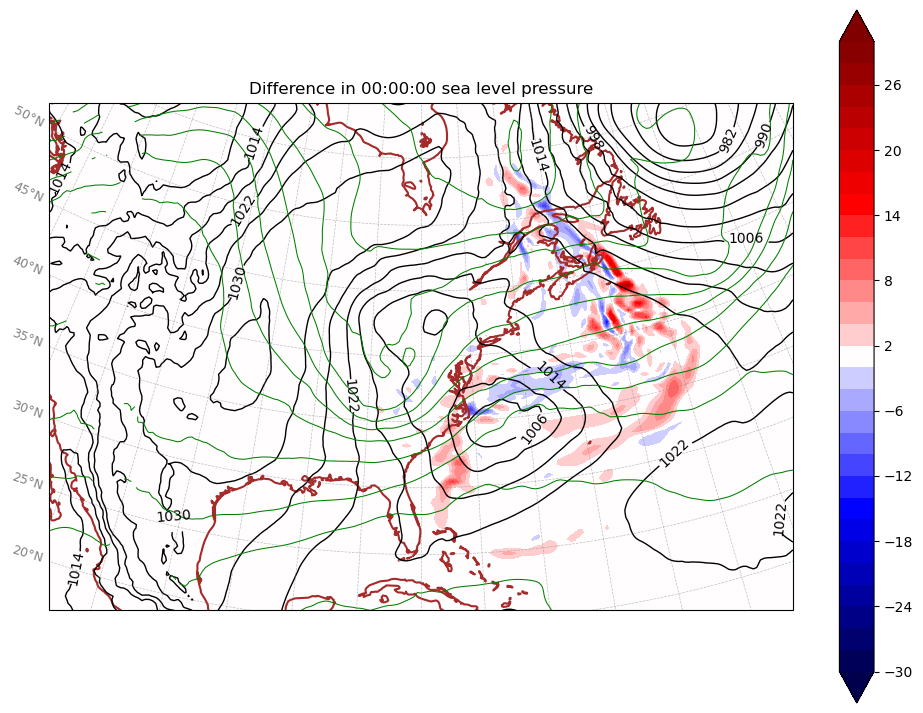

In [8]:
shdrng = np.arange(-30.,30.1,2.)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
slprng = np.arange(950.,1050.1,4.)
thkrng = np.arange(3700.,4500.1,50.)

fig, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpSLPInit,unpThk850_500Init],
                                        contIntervalList=[slprng,thkrng], 
                                        contColorList=['black','green'],
                                        contLineThicknessList=[1.0,0.75],
                                        shadVariable=ptdSLPInit-unpSLPInit,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None)
# add a title
fig.gca().set_title('Difference in 00:00:00 sea level pressure')
# add contour labels to slp
fig.gca().clabel(cons[0],levels=slprng[::2])

generating 2 contours


<a list of 19 text.Text objects>

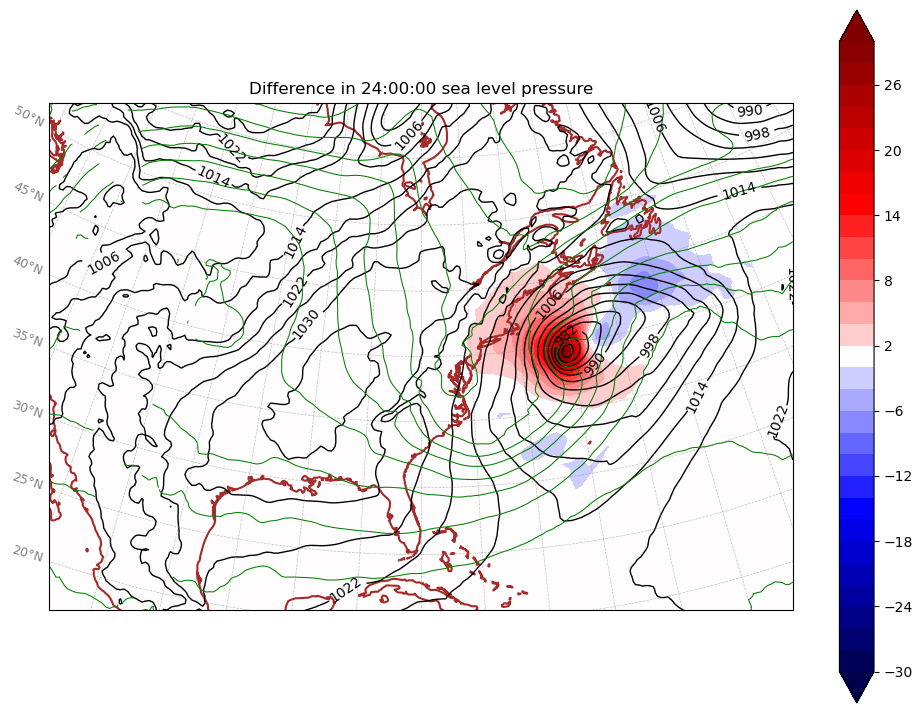

In [9]:
shdrng = np.arange(-30.,30.1,2.)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
slprng = np.arange(950.,1050.1,4.)
thkrng = np.arange(3700.,4500.1,50.)

fig, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlFcst,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpSLPFcst,unpThk850_500Fcst],
                                        contIntervalList=[slprng,thkrng], 
                                        contColorList=['black','green'],
                                        contLineThicknessList=[1.0,0.75],
                                        shadVariable=ptdSLPFcst-unpSLPFcst,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None)
# add a title
fig.gca().set_title('Difference in ' + str(fcstHr) + ':00:00 sea level pressure')
# add contour labels to slp
fig.gca().clabel(cons[0],levels=slprng[::2])

generating 1 contours


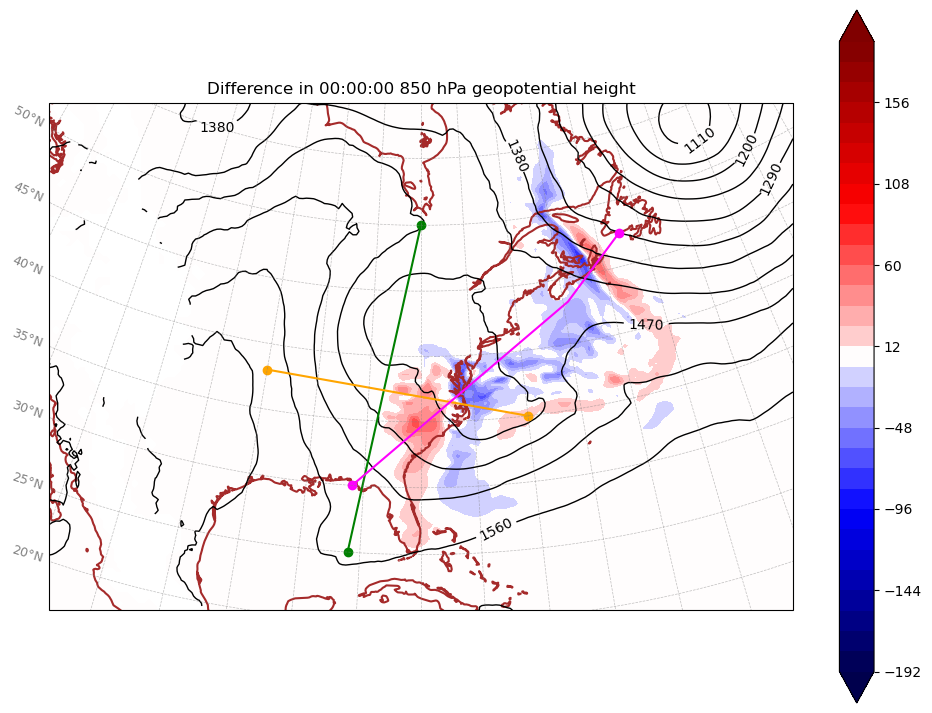

In [11]:
shdrng = np.arange(-192.,192.1,12.)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
hgtrng = np.arange(1020.,1700.1,45.)

fig, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpHGT850Init],
                                        contIntervalList=[hgtrng], 
                                        contColorList=['black'],
                                        contLineThicknessList=[1.0],
                                        shadVariable=ptdHGT850Init-unpHGT850Init,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None)
# add a title
fig.gca().set_title('Difference in 00:00:00 850 hPa geopotential height')
# add contour labels to heights
fig.gca().clabel(cons[0],levels=hgtrng[::2])
# define and plot cross-section
latBeg = 25.
lonBeg = -86.
latEnd = 50.
lonEnd = -80.
fig.gca().plot(lonBeg,latBeg,'o',transform=plotProj,color='green')
fig.gca().plot(lonEnd,latEnd,'o',transform=plotProj,color='green')
fig.gca().plot((lonBeg,lonEnd),(latBeg,latEnd),transform=plotProj,color='green')
latBeg = 38.
lonBeg = -95.
latEnd = 35.
lonEnd = -70.
fig.gca().plot(lonBeg,latBeg,'o',transform=plotProj,color='orange')
fig.gca().plot(lonEnd,latEnd,'o',transform=plotProj,color='orange')
fig.gca().plot((lonBeg,lonEnd),(latBeg,latEnd),transform=plotProj,color='orange')
latBeg = 30.
lonBeg = -86.
latEnd = 47.5
lonEnd = -57.5
fig.gca().plot(lonBeg,latBeg,'o',transform=plotProj,color='magenta')
fig.gca().plot(lonEnd,latEnd,'o',transform=plotProj,color='magenta')
fig.gca().plot((lonBeg,lonEnd),(latBeg,latEnd),transform=plotProj,color='magenta')

generating 1 contours


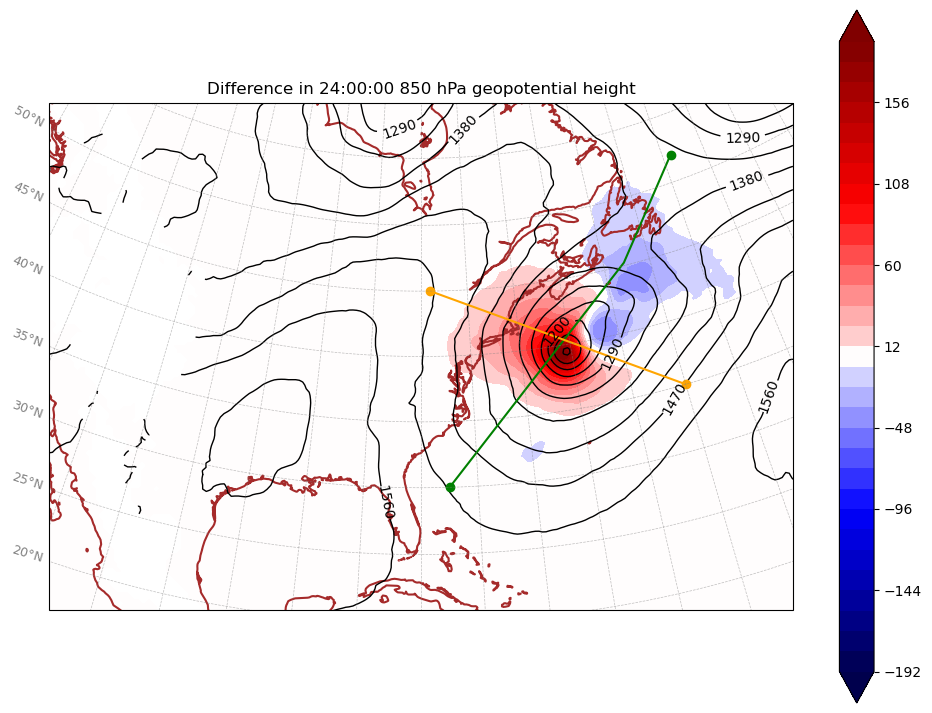

In [12]:
shdrng = np.arange(-192.,192.1,12.)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
hgtrng = np.arange(1020.,1700.1,45.)

fig, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlFcst,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpHGT850Fcst],
                                        contIntervalList=[hgtrng], 
                                        contColorList=['black'],
                                        contLineThicknessList=[1.0],
                                        shadVariable=ptdHGT850Fcst-unpHGT850Fcst,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None)
# add a title
fig.gca().set_title('Difference in ' + str(fcstHr) + ':00:00 850 hPa geopotential height')
# add contour labels to heights
fig.gca().clabel(cons[0],levels=hgtrng[::2])
# define and plot cross-section
latBeg = 30.
lonBeg = -77.5
latEnd = 52.
lonEnd = -49.
fig.gca().plot(lonBeg,latBeg,'o',transform=plotProj,color='green')
fig.gca().plot(lonEnd,latEnd,'o',transform=plotProj,color='green')
fig.gca().plot((lonBeg,lonEnd),(latBeg,latEnd),transform=plotProj,color='green')
latBeg = 45.
lonBeg = -79.
latEnd = 35.
lonEnd = -55.
fig.gca().plot(lonBeg,latBeg,'o',transform=plotProj,color='orange')
fig.gca().plot(lonEnd,latEnd,'o',transform=plotProj,color='orange')
fig.gca().plot((lonBeg,lonEnd),(latBeg,latEnd),transform=plotProj,color='orange')

generating 1 contours


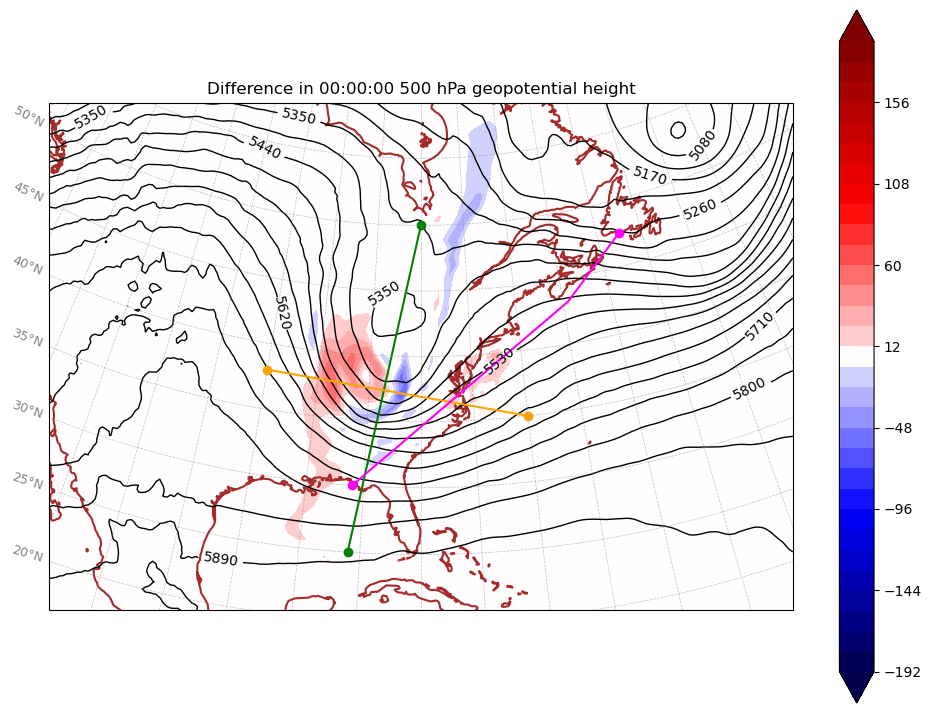

In [13]:
shdrng = np.arange(-192.,192.1,12.)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
hgtrng = np.arange(4900.,6100.1,45.)

fig, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlInit,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpHGT500Init],
                                        contIntervalList=[hgtrng], 
                                        contColorList=['black'],
                                        contLineThicknessList=[1.0],
                                        shadVariable=ptdHGT500Init-unpHGT500Init,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None)
# add a title
fig.gca().set_title('Difference in 00:00:00 500 hPa geopotential height')
# add contour labels to heights
fig.gca().clabel(cons[0],levels=hgtrng[::2])
# define and plot cross-section
latBeg = 25.
lonBeg = -86.
latEnd = 50.
lonEnd = -80.
fig.gca().plot(lonBeg,latBeg,'o',transform=plotProj,color='green')
fig.gca().plot(lonEnd,latEnd,'o',transform=plotProj,color='green')
fig.gca().plot((lonBeg,lonEnd),(latBeg,latEnd),transform=plotProj,color='green')
latBeg = 38.
lonBeg = -95.
latEnd = 35.
lonEnd = -70.
fig.gca().plot(lonBeg,latBeg,'o',transform=plotProj,color='orange')
fig.gca().plot(lonEnd,latEnd,'o',transform=plotProj,color='orange')
fig.gca().plot((lonBeg,lonEnd),(latBeg,latEnd),transform=plotProj,color='orange')
latBeg = 30.
lonBeg = -86.
latEnd = 47.5
lonEnd = -57.5
fig.gca().plot(lonBeg,latBeg,'o',transform=plotProj,color='magenta')
fig.gca().plot(lonEnd,latEnd,'o',transform=plotProj,color='magenta')
fig.gca().plot((lonBeg,lonEnd),(latBeg,latEnd),transform=plotProj,color='magenta')

generating 1 contours


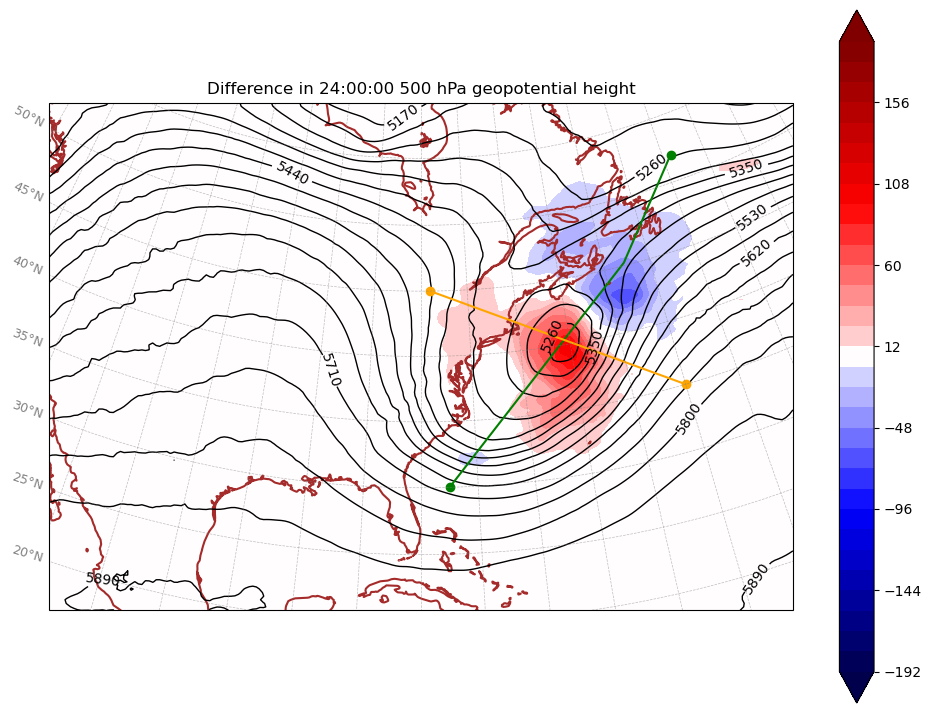

In [14]:
shdrng = np.arange(-192.,192.1,12.)
mask = np.ones((np.shape(shdrng)),dtype='bool')
mask[np.where(shdrng==0.)] = False
hgtrng = np.arange(4900.,6100.1,45.)

fig, (shd, cons, vec) = plan_section_plot(wrfHDL=unpHdlFcst,
                                        lat=lat,
                                        lon=lon,
                                        contVariableList=[unpHGT500Fcst],
                                        contIntervalList=[hgtrng], 
                                        contColorList=['black'],
                                        contLineThicknessList=[1.0],
                                        shadVariable=ptdHGT500Fcst-unpHGT500Fcst,
                                        shadInterval=shdrng[mask],
                                        shadAlpha=1.0,
                                        datProj=datProj,
                                        plotProj=plotProj,
                                        shadCmap='seismic',
                                        uVecVariable=None,
                                        vVecVariable=None,
                                        vectorThinning=None,
                                        vecColor=None)
# add a title
fig.gca().set_title('Difference in ' + str(fcstHr) + ':00:00 500 hPa geopotential height')
# add contour labels to heights
fig.gca().clabel(cons[0],levels=hgtrng[::2])
# define and plot cross-section
latBeg = 30.
lonBeg = -77.5
latEnd = 52.
lonEnd = -49.
fig.gca().plot(lonBeg,latBeg,'o',transform=plotProj,color='green')
fig.gca().plot(lonEnd,latEnd,'o',transform=plotProj,color='green')
fig.gca().plot((lonBeg,lonEnd),(latBeg,latEnd),transform=plotProj,color='green')
latBeg = 45.
lonBeg = -79.
latEnd = 35.
lonEnd = -55.
fig.gca().plot(lonBeg,latBeg,'o',transform=plotProj,color='orange')
fig.gca().plot(lonEnd,latEnd,'o',transform=plotProj,color='orange')
fig.gca().plot((lonBeg,lonEnd),(latBeg,latEnd),transform=plotProj,color='orange')

In [15]:
unpS = get_wrf_ss(unpHdlInit)
ptdS = get_wrf_ss(ptdHdlInit)

/home/bhoover/miniconda3/envs/UWAOS_WRF_QOIP/lib/python3.11/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


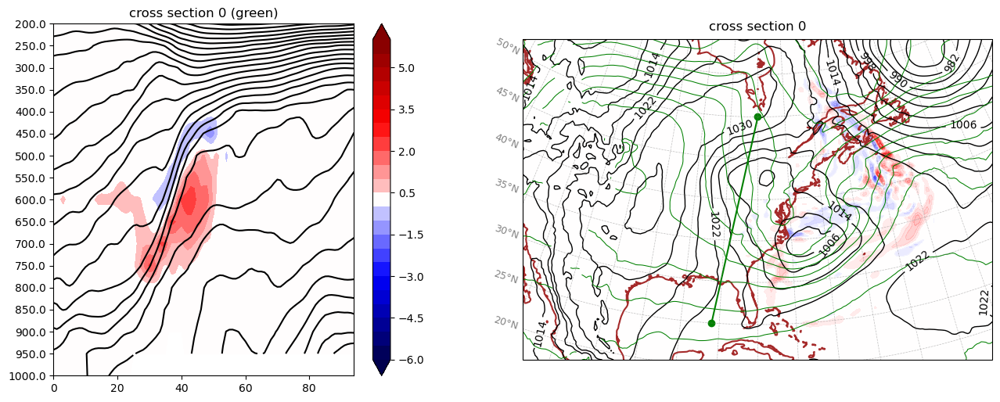

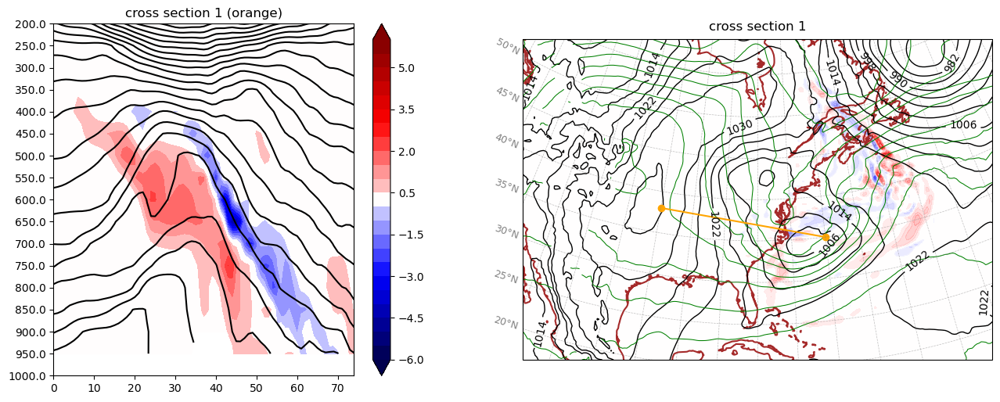

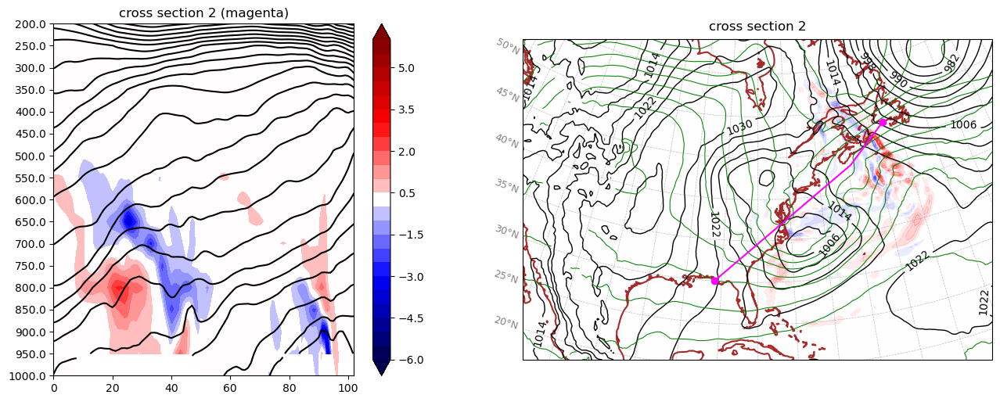

In [16]:
# cross-sections: perturbation potential temperature
wrfHDL = unpHdlInit
latBegList = [ 25.0,  38.0,  30.0]
lonBegList = [-86.0, -95.0, -86.0]
latEndList = [ 50.0,  35.0,  47.5]
lonEndList = [-80.0, -70.0, -57.5]
xSectShadInterval = np.arange(-6., 6.1, 0.5)
xSectShadInterval = xSectShadInterval[np.where(xSectShadInterval != 0.)]
slpPertInterval = np.arange(-30., 30.1, 2.)
slpPertInterval = slpPertInterval[np.where(slpPertInterval != 0.)]
fig = cross_section_plot(wrfHDL=unpHdlInit,
                         latBegList=latBegList,
                         lonBegList=lonBegList,
                         latEndList=latEndList,
                         lonEndList=lonEndList,
                         xSectContVariable=get_wrf_th(unpHdlInit),
                         xSectContInterval=np.arange(250., 450.1, 4.),
                         xSectShadVariable=get_wrf_tk(ptdHdlInit)-get_wrf_tk(unpHdlInit),
                         xSectShadInterval=xSectShadInterval,
                         slp=get_wrf_slp(unpHdlInit),
                         slpInterval=np.arange(950., 1050.1, 4.),
                         thk=unpThk850_500Fcst,
                         thkInterval=np.arange(3700., 4500.1, 50.),
                         slpPert=get_wrf_slp(ptdHdlInit)-get_wrf_slp(unpHdlInit),
                         slpPertInterval=slpPertInterval,
                         datProj=datProj,
                         plotProj=plotProj,
                         presLevMin=20000.
                        )
plt.show(fig)

/home/bhoover/miniconda3/envs/UWAOS_WRF_QOIP/lib/python3.11/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


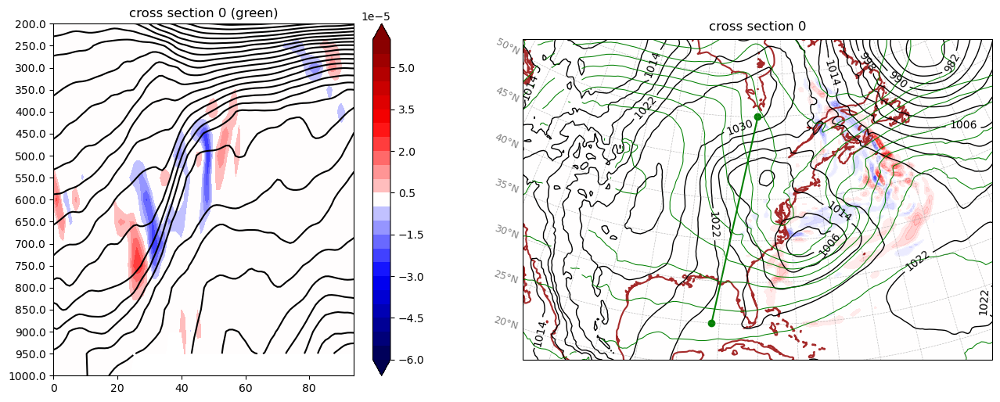

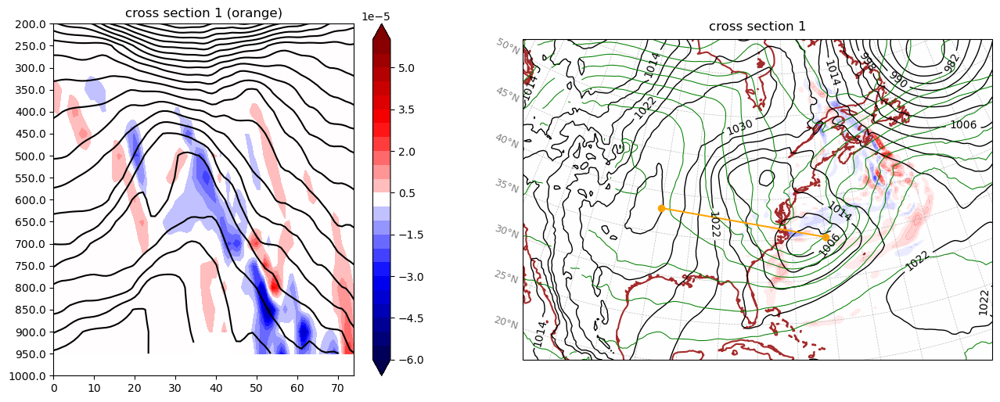

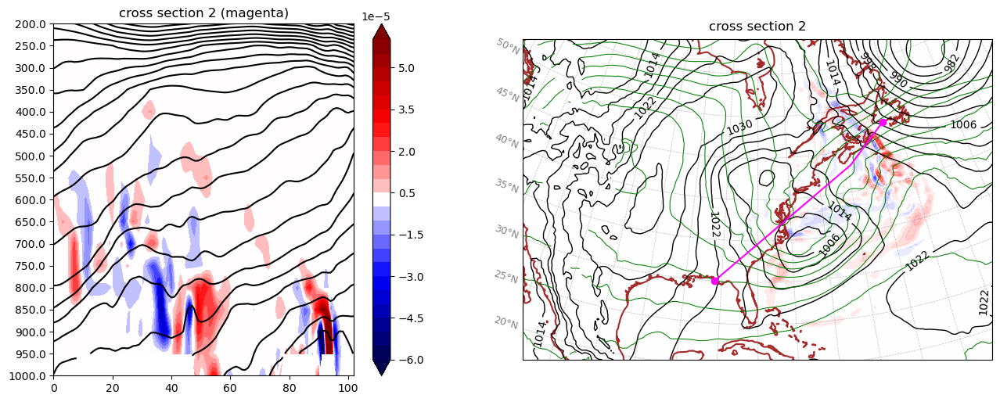

In [17]:
# cross-sections: perturbation vorticity
wrfHDL = unpHdlInit
latBegList = [ 25.0,  38.0,  30.0]
lonBegList = [-86.0, -95.0, -86.0]
latEndList = [ 50.0,  35.0,  47.5]
lonEndList = [-80.0, -70.0, -57.5]
xSectShadInterval = 1.0E-05 * np.arange(-6., 6.1, 0.5)
xSectShadInterval = xSectShadInterval[np.where(xSectShadInterval != 0.)]
slpPertInterval = np.arange(-30., 30.1, 2.)
slpPertInterval = slpPertInterval[np.where(slpPertInterval != 0.)]
fig = cross_section_plot(wrfHDL=unpHdlInit,
                         latBegList=latBegList,
                         lonBegList=lonBegList,
                         latEndList=latEndList,
                         lonEndList=lonEndList,
                         xSectContVariable=get_wrf_th(unpHdlInit),
                         xSectContInterval=np.arange(250., 450.1, 4.),
                         xSectShadVariable=ptdVORInit-unpVORInit,
                         xSectShadInterval=xSectShadInterval,
                         slp=get_wrf_slp(unpHdlInit),
                         slpInterval=np.arange(950., 1050.1, 4.),
                         thk=unpThk850_500Fcst,
                         thkInterval=np.arange(3700., 4500.1, 50.),
                         slpPert=get_wrf_slp(ptdHdlInit)-get_wrf_slp(unpHdlInit),
                         slpPertInterval=slpPertInterval,
                         datProj=datProj,
                         plotProj=plotProj,
                         presLevMin=20000.
                        )
plt.show(fig)

/home/bhoover/miniconda3/envs/UWAOS_WRF_QOIP/lib/python3.11/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


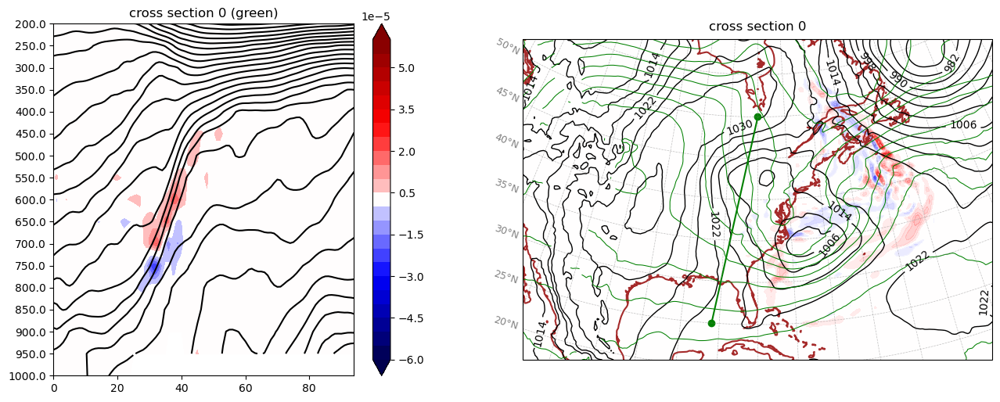

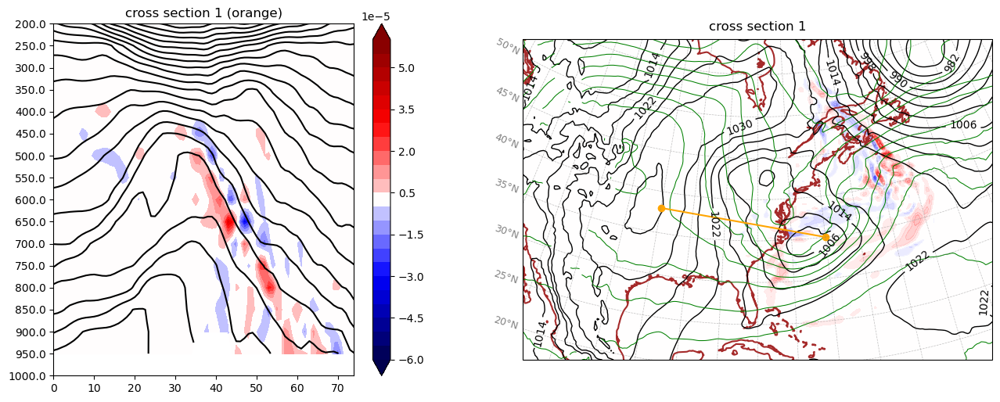

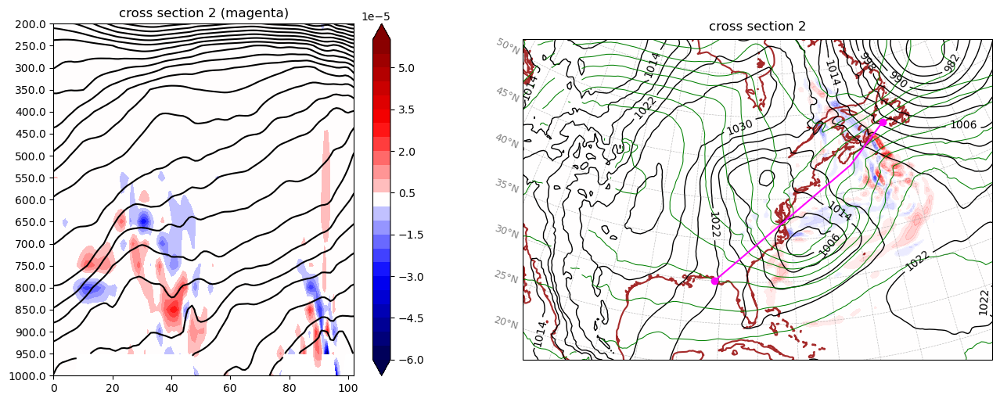

In [18]:
# cross-sections: perturbation divergence
wrfHDL = unpHdlInit
latBegList = [ 25.0,  38.0,  30.0]
lonBegList = [-86.0, -95.0, -86.0]
latEndList = [ 50.0,  35.0,  47.5]
lonEndList = [-80.0, -70.0, -57.5]
xSectShadInterval = 1.0E-05 * np.arange(-6., 6.1, 0.5)
xSectShadInterval = xSectShadInterval[np.where(xSectShadInterval != 0.)]
slpPertInterval = np.arange(-30., 30.1, 2.)
slpPertInterval = slpPertInterval[np.where(slpPertInterval != 0.)]
fig = cross_section_plot(wrfHDL=unpHdlInit,
                         latBegList=latBegList,
                         lonBegList=lonBegList,
                         latEndList=latEndList,
                         lonEndList=lonEndList,
                         xSectContVariable=get_wrf_th(unpHdlInit),
                         xSectContInterval=np.arange(250., 450.1, 4.),
                         xSectShadVariable=ptdDIVInit-unpDIVInit,
                         xSectShadInterval=xSectShadInterval,
                         slp=get_wrf_slp(unpHdlInit),
                         slpInterval=np.arange(950., 1050.1, 4.),
                         thk=unpThk850_500Fcst,
                         thkInterval=np.arange(3700., 4500.1, 50.),
                         slpPert=get_wrf_slp(ptdHdlInit)-get_wrf_slp(unpHdlInit),
                         slpPertInterval=slpPertInterval,
                         datProj=datProj,
                         plotProj=plotProj,
                         presLevMin=20000.
                        )
plt.show(fig)

/home/bhoover/miniconda3/envs/UWAOS_WRF_QOIP/lib/python3.11/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


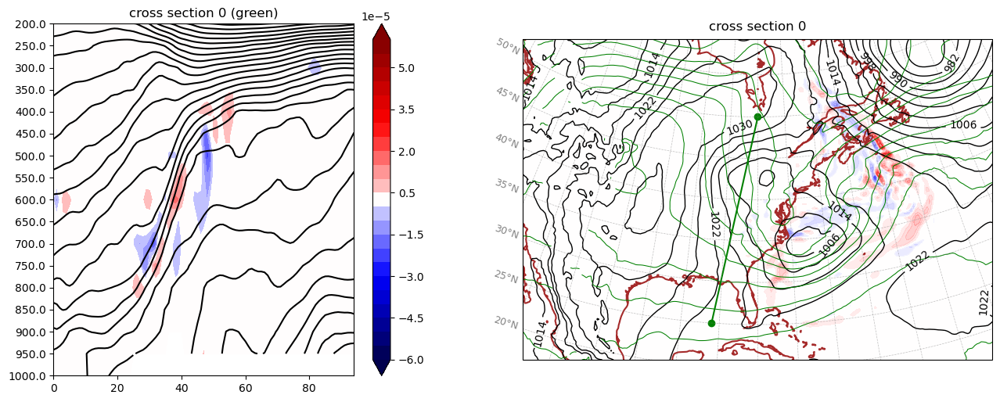

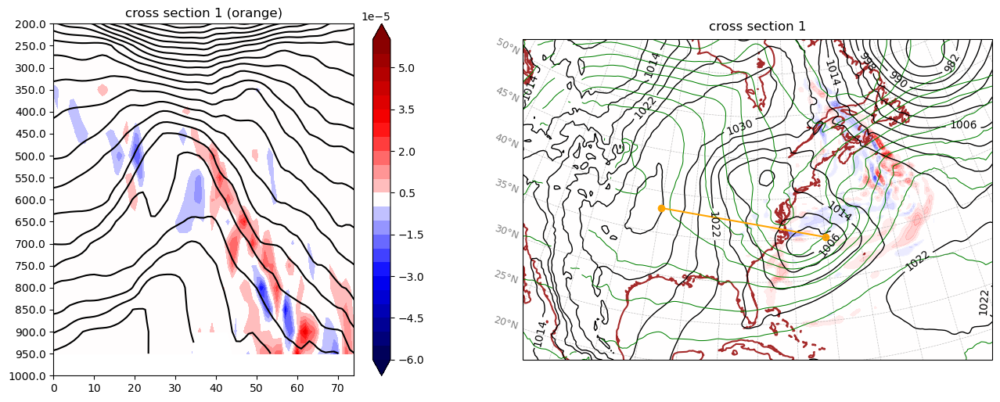

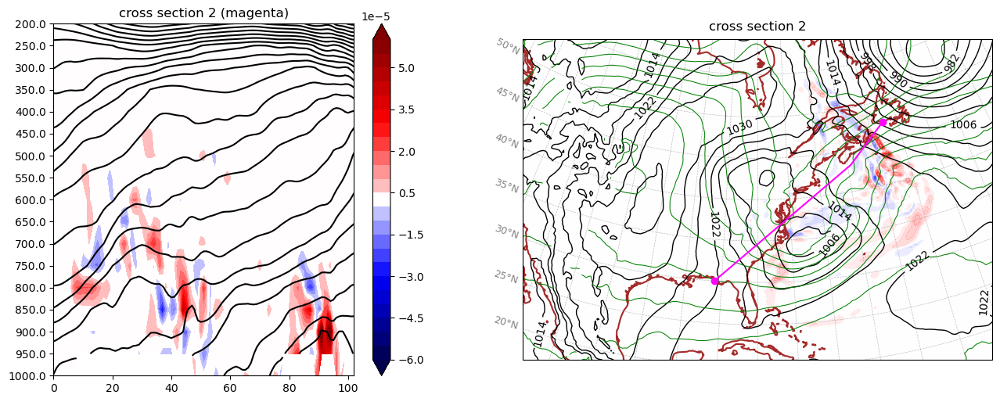

In [19]:
# cross-sections: perturbation deformation
wrfHDL = unpHdlInit
latBegList = [ 25.0,  38.0,  30.0]
lonBegList = [-86.0, -95.0, -86.0]
latEndList = [ 50.0,  35.0,  47.5]
lonEndList = [-80.0, -70.0, -57.5]
xSectShadInterval = 1.0E-05 * np.arange(-6., 6.1, 0.5)
xSectShadInterval = xSectShadInterval[np.where(xSectShadInterval != 0.)]
slpPertInterval = np.arange(-30., 30.1, 2.)
slpPertInterval = slpPertInterval[np.where(slpPertInterval != 0.)]
fig = cross_section_plot(wrfHDL=unpHdlInit,
                         latBegList=latBegList,
                         lonBegList=lonBegList,
                         latEndList=latEndList,
                         lonEndList=lonEndList,
                         xSectContVariable=get_wrf_th(unpHdlInit),
                         xSectContInterval=np.arange(250., 450.1, 4.),
                         xSectShadVariable=ptdDEFInit-unpDEFInit,
                         xSectShadInterval=xSectShadInterval,
                         slp=get_wrf_slp(unpHdlInit),
                         slpInterval=np.arange(950., 1050.1, 4.),
                         thk=unpThk850_500Fcst,
                         thkInterval=np.arange(3700., 4500.1, 50.),
                         slpPert=get_wrf_slp(ptdHdlInit)-get_wrf_slp(unpHdlInit),
                         slpPertInterval=slpPertInterval,
                         datProj=datProj,
                         plotProj=plotProj,
                         presLevMin=20000.
                        )
plt.show(fig)